# Recipe for Creating the Most Expensive Painting in the History

## Factor analysis on the most expensive paintings in the history

### Wikipedia API
Install: $ pip install pymediawiki

Documentation: https://pymediawiki.readthedocs.io/en/latest/quickstart.html#quickstart

Examples:
wikipedia.search('washington')

In [1380]:
#Connect to Wikipedia API
from mediawiki import MediaWiki
wikipedia = MediaWiki()

# import libraries
from bs4 import BeautifulSoup # For HTML parsing
import urllib # Website connections
import re # Regular expressions
import numpy as np
from time import sleep # To prevent overwhelming the server between connections
from collections import Counter # Keep track of our term counts
from nltk.corpus import stopwords # Filter out stopwords, such as 'the', 'or', 'and'
import pandas as pd # For converting results to a dataframe and bar chart plots
%matplotlib inline
import requests
import pandas as pd

In [1381]:
#Search for a list of most expensive paintings in the history in Wikipedia
Search1 = wikipedia.search('most expensive paintings')
Search1

['List of most expensive paintings',
 'Lists of most expensive items by category',
 'List of most expensive photographs',
 'List of stolen paintings',
 'List of most expensive sculptures',
 'Alastair Sooke',
 'List of most expensive books and manuscripts',
 'Irises (painting)',
 "Flower paintings of Georgia O'Keeffe",
 'Number 17A']

In [1382]:
#Refining search result -> Select the wikipedia page that contains the infomation
page = Search1[0]
page

'List of most expensive paintings'

This wikipedia page contains a listing of 89 most expensive paintings in the history

https://en.wikipedia.org/wiki/List_of_most_expensive_paintings

In [1383]:
#Get all data from the Wikipedia Page

List_URL = 'https://en.wikipedia.org/wiki/' + page
List = requests.get(List_URL).text
List

'<!DOCTYPE html>\n<html class="client-nojs" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8"/>\n<title>List of most expensive paintings - Wikipedia</title>\n<script>document.documentElement.className = document.documentElement.className.replace( /(^|\\s)client-nojs(\\s|$)/, "$1client-js$2" );</script>\n<script>(window.RLQ=window.RLQ||[]).push(function(){mw.config.set({"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":false,"wgNamespaceNumber":0,"wgPageName":"List_of_most_expensive_paintings","wgTitle":"List of most expensive paintings","wgCurRevisionId":863025309,"wgRevisionId":863025309,"wgArticleId":235235,"wgIsArticle":true,"wgIsRedirect":false,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with Japanese-language external links","Wikipedia articles in need of updating from May 2018","All Wikipedia articles in need of updating","Interlanguage link template link number","Pages with graphs","Lists of most expensive things","Lists of visual ar

In [1415]:
# Refine to only the HTML table
header = {'User-Agent': 'Mozilla/5.0'} #Needed to prevent 403 error on Wikipedia
req = urllib.request.Request(List_URL,headers=header)
source = urllib.request.urlopen(req)
soup = BeautifulSoup(source)
table = soup.find("table", { "class" : "wikitable sortable" })
table.get_text()

'\n\nAdjusted price(in millions)\n\nOriginal price(in millions)\n\nPainting\n\nImage\n\nArtist\n\nYear\n\nDate of sale\n\nRankat sale\n\nSeller\n\nBuyer\n\nAuction house\n\n\n$450.3\n\n$450.3\n\nSalvator Mundi\n\n\n\nattributed toLeonardo da Vinci\n\nc.\u20091500\n\nNovember 15, 2017\n\n1\n\nDmitry Rybolovlev\n\nAbu Dhabi Department of Culture & Tourism[9]\n\nChristie\'s, New York[10]\n\n\n~$310\n\n~$300\n\nInterchange\n\n\n\nWillem de Kooning\n\n1955\n\nSeptember 2015\n\n1\n\nDavid Geffen Foundation\n\nKenneth C. Griffin\n\nPrivate sale[11]\n\n\n$272 +\n\n$250 + [note 2]\n\nThe Card Players\n\n\n\nPaul Cézanne\n\n1892/93\n\nApril 2011\n\n1\n\nGeorge Embiricos\n\nState of Qatar\n\nPrivate sale[12][13][14]\n\n\n$217\n\n$210 [15]\n\nNafea Faa Ipoipo(When Will You Marry?)\n\n\n\nPaul Gauguin\n\n1892\n\nSeptember 2014\n\n2\n\nHeirs of Rudolf Staechelin\n\nState of Qatar\n\nPrivate sale[16]\n\n\n~$206\n\n~$200\n\nNumber 17A\n\n\n\nJackson Pollock\n\n1948\n\nSeptember 2015\n\n4\n\nDavid Geff

In [1416]:
#Store table into Pandas Dataframe showing the most expensive 89 paintings in the history
df=pd.read_html(List_URL )
new_df=df[1][1:]
new_df.columns=["AdjPrice","OriginalPrice","Painting","image","Artist","Year","SaleDate","Rank","Seller","Buyer","AuctionHouse"]
new_df

,AdjPrice,OriginalPrice,Painting,image,Artist,Year,SaleDate,Rank,Seller,Buyer,AuctionHouse
1,$450.3,$450.3,Salvator Mundi,NaN,attributed toLeonardo da Vinci,c. 1500,"November 15, 2017",1,Dmitry Rybolovlev,Abu Dhabi Department of Culture & Tourism[9],"Christie's, New York[10]"
2,~$310,~$300,Interchange,NaN,Willem de Kooning,1955,September 2015,1,David Geffen Foundation,Kenneth C. Griffin,Private sale[11]
3,$272 +,$250 + [note 2],The Card Players,NaN,Paul Cézanne,1892/93,April 2011,1,George Embiricos,State of Qatar,Private sale[12][13][14]
4,$217,$210 [15],Nafea Faa Ipoipo(When Will You Marry?),NaN,Paul Gauguin,1892,September 2014,2,Heirs of Rudolf Staechelin,State of Qatar,Private sale[16]
5,~$206,~$200,Number 17A,NaN,Jackson Pollock,1948,September 2015,4,David Geffen Foundation,Kenneth C. Griffin,Private sale[11]
6,$193.1,$183.8,Wasserschlangen II,NaN,Gustav Klimt,1904-07,2013,2,Yves Bouvier,Dmitry Rybolovlev,Private sale [note 3]
7,$192,$186(€140),"No. 6 (Violet, Green and Red)",NaN,Mark Rothko,1951,August 2014,3,Cherise Moueix,Dmitry Rybolovlev,Private sale viaYves Bouvier[19]
8,$186,$180(€160Mfor pair),Pendant portraits ofMaerten Soolmansand Oopjen...,NaN,Rembrandt,1634,September 2015,7,Éric de Rothschild,Rijksmuseumand Louvre,Private sale[20]
9,$185.2,$179.4,"Les Femmes d'Alger(""Version O"")",NaN,Pablo Picasso,1955,"May 11, 2015",5,Private collection,Hamad bin Jassim bin Jaber Al Thani[21],"Christie's, New York[22]"
10,$175.9,$170.4,Nu couché,NaN,Amedeo Modigliani,1917/18,"November 9, 2015",9,Laura Mattioli Rossi,Liu Yiqian[23],"Christie's, New York[24]"


In [1417]:
# drop image colunmn which is NaN
Clean = new_df.drop(["image"], axis=1)
Clean

,AdjPrice,OriginalPrice,Painting,Artist,Year,SaleDate,Rank,Seller,Buyer,AuctionHouse
1,$450.3,$450.3,Salvator Mundi,attributed toLeonardo da Vinci,c. 1500,"November 15, 2017",1,Dmitry Rybolovlev,Abu Dhabi Department of Culture & Tourism[9],"Christie's, New York[10]"
2,~$310,~$300,Interchange,Willem de Kooning,1955,September 2015,1,David Geffen Foundation,Kenneth C. Griffin,Private sale[11]
3,$272 +,$250 + [note 2],The Card Players,Paul Cézanne,1892/93,April 2011,1,George Embiricos,State of Qatar,Private sale[12][13][14]
4,$217,$210 [15],Nafea Faa Ipoipo(When Will You Marry?),Paul Gauguin,1892,September 2014,2,Heirs of Rudolf Staechelin,State of Qatar,Private sale[16]
5,~$206,~$200,Number 17A,Jackson Pollock,1948,September 2015,4,David Geffen Foundation,Kenneth C. Griffin,Private sale[11]
6,$193.1,$183.8,Wasserschlangen II,Gustav Klimt,1904-07,2013,2,Yves Bouvier,Dmitry Rybolovlev,Private sale [note 3]
7,$192,$186(€140),"No. 6 (Violet, Green and Red)",Mark Rothko,1951,August 2014,3,Cherise Moueix,Dmitry Rybolovlev,Private sale viaYves Bouvier[19]
8,$186,$180(€160Mfor pair),Pendant portraits ofMaerten Soolmansand Oopjen...,Rembrandt,1634,September 2015,7,Éric de Rothschild,Rijksmuseumand Louvre,Private sale[20]
9,$185.2,$179.4,"Les Femmes d'Alger(""Version O"")",Pablo Picasso,1955,"May 11, 2015",5,Private collection,Hamad bin Jassim bin Jaber Al Thani[21],"Christie's, New York[22]"
10,$175.9,$170.4,Nu couché,Amedeo Modigliani,1917/18,"November 9, 2015",9,Laura Mattioli Rossi,Liu Yiqian[23],"Christie's, New York[24]"


Alternative Code I used initially that caused issue:

table_rows = table.find_all('tr')
Work = []
for tr in table_rows:
    td = tr.find_all(['th','td'])
    row = [tr.text.strip() for tr in td if tr.text.strip()]
    if row:
        Work.append(row)

Worksdf = pd.DataFrame(Work, columns = ["AdjPrice","OriginalPrice","Painting","Artist","Year","SaleDate","Rank","Seller","Buyer","AuctionHouse","Delete"])
print(Worksdf)



When there are blank cells from original table, information from next column gets shifted. 

Example: on rowl 16, Column 'Rank' was blank but takes in 'Sotheby's, New York[32]', which should be in column'Auction house'

Suggested solution from Rhys:

Worksdf.fillna(value=pd.np.nan, inplace=True)

## Factor 1:

### You have to live in which century to create the work to have better chances?

(array([ 1.,  0.,  4.,  2.,  2.,  0.,  0.,  0., 39., 41.]),
 array([1350. , 1413.4, 1476.8, 1540.2, 1603.6, 1667. , 1730.4, 1793.8,
        1857.2, 1920.6, 1984. ], dtype=float32),
 <a list of 10 Patch objects>)

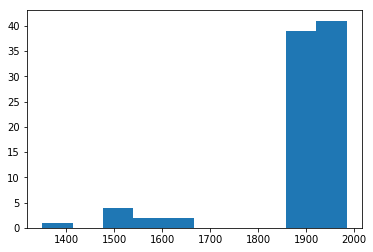

In [1418]:
Clean['Year']
Y = Clean['Year'].str.extract('(\d+)')
y = pd.to_numeric(Y[0], downcast='float')
import matplotlib.pyplot as plt
plt.hist(y)

### Conclusion:
##### Modern art and Contemporary art have better chances to fetch highrt prices at aution.
##### Or, born in Renaissance period also helps.

##### Possibly biased, as historical auction records might not be avaliable 



In [1419]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout, Box, Histogram

init_notebook_mode()

data = [Histogram(x=Clean['Year'])]
layout = Layout(title='Centuries of the most expensive paintings')
fig= Figure(data=data,layout=layout)
iplot(fig, filename='Hist')

## Factor 2:
### At which phase of your life should you create the masterpiece?




In [1420]:
# Same artists have multiple paintings in above list->Create a separate list of artists (unique values)
Clean['Artist'].nunique()

33

### Noted that 33 Artists have created the 89 most expensive paintings in the history

In [1421]:
from collections import Counter
countresult = Counter(Clean['Artist'])
pdcount = pd.DataFrame.from_dict(countresult, orient='index').reset_index() # Store in dataframe
pdcount = pdcount.rename(columns={'index':'Artist', 0:'paintingscount'}) # Rename the columns
#pdcount['paintingscount'] = pdcount['paintingscount'].astype('float')
pdcount = pdcount.sort_values(by='paintingscount', ascending=False) 
#Sort artist by number of expensive paintings created
pdcount

,Artist,paintingscount
8,Pablo Picasso,14
11,Vincent van Gogh,9
16,Andy Warhol,7
6,Mark Rothko,6
1,Willem de Kooning,4
9,Amedeo Modigliani,4
12,Francis Bacon,4
3,Paul Gauguin,3
21,Claude Monet,3
20,Titian,3


#### To get the age when artists created the masterpiece, first to get artists' birth year
#### To get artists' birth year, first get a summary of the artist
Get wikipedia summary(title, sentences=0, chars=0, auto_suggest=True, redirect=True)
#### Before using for loop, first make sure wikipedia "recognize" all of our artists
#### To adjust all our keyword (Artist's name), first print out all errors

In [1422]:
# try retrieving summary for each artist by name, identify error if wikipedia cannot direct to the correct page 
Search2 = wikipedia.search('Wang Meng')
Search2
#Too many Wang Meng, Wikipedia is confused

['Wang Meng',
 'Wang Meng (speed skater)',
 'Wang Meng (artist)',
 'Wang Meng (author)',
 'Meng Hongwei',
 'Fu Jian (337–385)',
 'Consort Meng Arrives',
 'Wang Meng (figure skater)',
 'Wang Meng (Former Qin)',
 'Wang Meng (curler)']

In [1423]:
pdcount['Artist']= pdcount['Artist'].replace(['Wang Meng'], 'Wang Meng (artist)')
Clean['Artist']= Clean['Artist'].replace(['Wang Meng'], 'Wang Meng (artist)')
#Identify correct Wang Meng, adjust in dataframe

In [1424]:
pdcount['Artist']= pdcount['Artist'].replace(['attributed toLeonardo da Vinci'], 'Leonardo da Vinci')
Clean['Artist']= Clean['Artist'].replace(['attributed toLeonardo da Vinci'], 'Leonardo da Vinci')
#Fixing Da Vinci's name

In [1425]:
for x in pdcount['Artist']:
        text = wikipedia.summary(x,sentences=3)
#No result, no error

In [1426]:
#Get birth date from Summary for all artists
birth =[]
for x in pdcount['Artist']:
    text = wikipedia.summary(x,sentences=3)
    birth.append(text[text.find("(")+1:text.find("–")][-5:])

In [1429]:
pdcount['BirthYear']=birth
pdcount

,Artist,paintingscount,BirthYear
8,Pablo Picasso,14,1881
11,Vincent van Gogh,9,1853
16,Andy Warhol,7,1928
6,Mark Rothko,6,1903
1,Willem de Kooning,4,1904
9,Amedeo Modigliani,4,1884
12,Francis Bacon,4,1561
3,Paul Gauguin,3,1848
21,Claude Monet,3,1840
20,Titian,3,1490


### Noted that:
### (1) Jasper John's birth year do not seem correct.  He was active in the 60s, can't be born in 2010.
### (2) Francis Bacon's birth year also do not seem correct, because wikipedia thought we are talking about the scientist Francis Bacon (There is another Francis Bacon who was an 20th Centurary Artist)

In [1427]:
#Noted that Jasper Johns is still alive, therefore no "-" in the ()
JJ = wikipedia.summary('Jasper Johns',sentences=3)
JJ

"Jasper Johns (born May 15, 1930) is an American painter, sculptor and printmaker whose work is associated with abstract expressionism, Neo-Dada, and pop art. He is well known for his depictions of the American flag and other US-related topics. Johns' works regularly receive millions of dollars at sale and auction, including a reported $110 million sale in 2010."

In [1430]:
#Update Johns' birthyear
pdcount.loc[15, 'BirthYear'] = '1930'
pdcount

,Artist,paintingscount,BirthYear
8,Pablo Picasso,14,1881
11,Vincent van Gogh,9,1853
16,Andy Warhol,7,1928
6,Mark Rothko,6,1903
1,Willem de Kooning,4,1904
9,Amedeo Modigliani,4,1884
12,Francis Bacon,4,1561
3,Paul Gauguin,3,1848
21,Claude Monet,3,1840
20,Titian,3,1490


In [1431]:
pdcount['Artist']= pdcount['Artist'].replace(['Francis Bacon'], 'Francis Bacon (artist)')
Clean['Artist']= Clean['Artist'].replace(['Francis Bacon'], 'Francis Bacon (artist)')
#Identify correct Francis Bacon, adjust in dataframe
FB = wikipedia.summary('Francis Bacon (artist)',sentences=3)
NewFB = FB[FB.find("(")+1:FB.find("–")][-5:]
NewFB

'1909 '

In [1432]:
#Update Bacon' birthyear
pdcount.loc[12, 'BirthYear'] = '1909'
pdcount

,Artist,paintingscount,BirthYear
8,Pablo Picasso,14,1881
11,Vincent van Gogh,9,1853
16,Andy Warhol,7,1928
6,Mark Rothko,6,1903
1,Willem de Kooning,4,1904
9,Amedeo Modigliani,4,1884
12,Francis Bacon (artist),4,1909
3,Paul Gauguin,3,1848
21,Claude Monet,3,1840
20,Titian,3,1490


### Calculate the Artist's Age when created the work (Work date - Birth year), then plot and make conclusions
    

In [1433]:
#First join the tables to show artist's birth year and year created the masterpiece in the same table
Clean.set_index("Artist")
pdcount.set_index("Artist")
join_df = Clean.merge(pdcount, on="Artist", how='left')
join_df

,AdjPrice,OriginalPrice,Painting,Artist,Year,SaleDate,Rank,Seller,Buyer,AuctionHouse,paintingscount,BirthYear
0,$450.3,$450.3,Salvator Mundi,Leonardo da Vinci,c. 1500,"November 15, 2017",1,Dmitry Rybolovlev,Abu Dhabi Department of Culture & Tourism[9],"Christie's, New York[10]",1,1452
1,~$310,~$300,Interchange,Willem de Kooning,1955,September 2015,1,David Geffen Foundation,Kenneth C. Griffin,Private sale[11],4,1904
2,$272 +,$250 + [note 2],The Card Players,Paul Cézanne,1892/93,April 2011,1,George Embiricos,State of Qatar,Private sale[12][13][14],3,1839
3,$217,$210 [15],Nafea Faa Ipoipo(When Will You Marry?),Paul Gauguin,1892,September 2014,2,Heirs of Rudolf Staechelin,State of Qatar,Private sale[16],3,1848
4,~$206,~$200,Number 17A,Jackson Pollock,1948,September 2015,4,David Geffen Foundation,Kenneth C. Griffin,Private sale[11],2,1912
5,$193.1,$183.8,Wasserschlangen II,Gustav Klimt,1904-07,2013,2,Yves Bouvier,Dmitry Rybolovlev,Private sale [note 3],3,1862
6,$192,$186(€140),"No. 6 (Violet, Green and Red)",Mark Rothko,1951,August 2014,3,Cherise Moueix,Dmitry Rybolovlev,Private sale viaYves Bouvier[19],6,1903
7,$186,$180(€160Mfor pair),Pendant portraits ofMaerten Soolmansand Oopjen...,Rembrandt,1634,September 2015,7,Éric de Rothschild,Rijksmuseumand Louvre,Private sale[20],1,1606
8,$185.2,$179.4,"Les Femmes d'Alger(""Version O"")",Pablo Picasso,1955,"May 11, 2015",5,Private collection,Hamad bin Jassim bin Jaber Al Thani[21],"Christie's, New York[22]",14,1881
9,$175.9,$170.4,Nu couché,Amedeo Modigliani,1917/18,"November 9, 2015",9,Laura Mattioli Rossi,Liu Yiqian[23],"Christie's, New York[24]",4,1884


In [1434]:
# change data type use .astype() 
#error occur, because some of the works are created during couple years
#update work year to be the year started
join_df['Year'] = join_df['Year'].str.extract('(\d+)').astype(int)
#join_df['Year'] = join_df.Year.astype(float)
join_df['BirthYear'] = join_df.BirthYear.astype(float)
join_df['Year'] = join_df.Year.astype(float)

In [1435]:
join_df['Age'] = join_df['Year'] - join_df['BirthYear']
join_df

,AdjPrice,OriginalPrice,Painting,Artist,Year,SaleDate,Rank,Seller,Buyer,AuctionHouse,paintingscount,BirthYear,Age
0,$450.3,$450.3,Salvator Mundi,Leonardo da Vinci,1500.0,"November 15, 2017",1,Dmitry Rybolovlev,Abu Dhabi Department of Culture & Tourism[9],"Christie's, New York[10]",1,1452.0,48.0
1,~$310,~$300,Interchange,Willem de Kooning,1955.0,September 2015,1,David Geffen Foundation,Kenneth C. Griffin,Private sale[11],4,1904.0,51.0
2,$272 +,$250 + [note 2],The Card Players,Paul Cézanne,1892.0,April 2011,1,George Embiricos,State of Qatar,Private sale[12][13][14],3,1839.0,53.0
3,$217,$210 [15],Nafea Faa Ipoipo(When Will You Marry?),Paul Gauguin,1892.0,September 2014,2,Heirs of Rudolf Staechelin,State of Qatar,Private sale[16],3,1848.0,44.0
4,~$206,~$200,Number 17A,Jackson Pollock,1948.0,September 2015,4,David Geffen Foundation,Kenneth C. Griffin,Private sale[11],2,1912.0,36.0
5,$193.1,$183.8,Wasserschlangen II,Gustav Klimt,1904.0,2013,2,Yves Bouvier,Dmitry Rybolovlev,Private sale [note 3],3,1862.0,42.0
6,$192,$186(€140),"No. 6 (Violet, Green and Red)",Mark Rothko,1951.0,August 2014,3,Cherise Moueix,Dmitry Rybolovlev,Private sale viaYves Bouvier[19],6,1903.0,48.0
7,$186,$180(€160Mfor pair),Pendant portraits ofMaerten Soolmansand Oopjen...,Rembrandt,1634.0,September 2015,7,Éric de Rothschild,Rijksmuseumand Louvre,Private sale[20],1,1606.0,28.0
8,$185.2,$179.4,"Les Femmes d'Alger(""Version O"")",Pablo Picasso,1955.0,"May 11, 2015",5,Private collection,Hamad bin Jassim bin Jaber Al Thani[21],"Christie's, New York[22]",14,1881.0,74.0
9,$175.9,$170.4,Nu couché,Amedeo Modigliani,1917.0,"November 9, 2015",9,Laura Mattioli Rossi,Liu Yiqian[23],"Christie's, New York[24]",4,1884.0,33.0


In [1436]:
a = join_df['Age']
a.describe()

count    89.000000
mean     43.775281
std      14.528775
min      20.000000
25%      35.000000
50%      42.000000
75%      51.000000
max      82.000000
Name: Age, dtype: float64

In [1437]:
data = [Histogram(x=a)]
layout = Layout(title='At what ages artists most likely hit creative peak')
fig= Figure(data=data,layout=layout)
iplot(fig, filename='Hist')

Alternative code for matplotlib

import matplotlib.pyplot as plt

plt.hist(a)

### Conclusion: Artists' career starts to pick up at 30
###                      might not have to starve at 20s but have to stay strong after 60s

## Factor 3:To be or not to be?

### Do Artist have to age slow or die young to to raise their work's prices?

In [1438]:
# Find out how many year each artists lived?
# Find out how many artists on the list are still alive?
#Get death year from Summary for all artists
d=[]
for x in pdcount['Artist']:
    text = wikipedia.summary(x,sentences=4)
    d.append(re.findall(' (\d+)\)', text))
    #death.append(text[text.find("("):text.find(")")][-4:])
death = [item[0] for item in d]   
pdcount['DeathYear'] = death

In [1439]:
pdcount['DeathYear'] = pdcount.DeathYear.astype(float)
pdcount['BirthYear'] = pdcount.BirthYear.astype(float)
pdcount['LifeSpan'] = pdcount['DeathYear'] - pdcount['BirthYear']
pdcount['DeathYear'] = death
Clean.set_index("Artist")
pdcount.set_index("Artist")
join_df = join_df.merge(pdcount, on="Artist", how='left')
pdcount.sort_values(by='LifeSpan', ascending=False) 

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan
1,Willem de Kooning,4,1904.0,1997,93.0
27,Qi Baishi,1,1864.0,1957,93.0
8,Pablo Picasso,14,1881.0,1973,92.0
21,Claude Monet,3,1840.0,1926,86.0
20,Titian,3,1490.0,1576,86.0
24,Henri Matisse,1,1869.0,1954,85.0
26,Cy Twombly,2,1928.0,2011,83.0
12,Francis Bacon (artist),4,1909.0,1992,83.0
14,Edvard Munch,1,1863.0,1944,81.0
13,Pierre-Auguste Renoir,1,1841.0,1919,78.0


In [1440]:
#Noted that Jasper Johns is still alive, so take him out
DeadArtist = pdcount.drop([15], axis=0)
DeadArtist.sort_values(by='LifeSpan', ascending=False) 

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan
27,Qi Baishi,1,1864.0,1957,93.0
1,Willem de Kooning,4,1904.0,1997,93.0
8,Pablo Picasso,14,1881.0,1973,92.0
21,Claude Monet,3,1840.0,1926,86.0
20,Titian,3,1490.0,1576,86.0
24,Henri Matisse,1,1869.0,1954,85.0
12,Francis Bacon (artist),4,1909.0,1992,83.0
26,Cy Twombly,2,1928.0,2011,83.0
14,Edvard Munch,1,1863.0,1944,81.0
13,Pierre-Auguste Renoir,1,1841.0,1919,78.0


(array([1., 2., 2., 1., 4., 4., 4., 5., 6., 3.]),
 array([28. , 34.5, 41. , 47.5, 54. , 60.5, 67. , 73.5, 80. , 86.5, 93. ]),
 <a list of 10 Patch objects>)

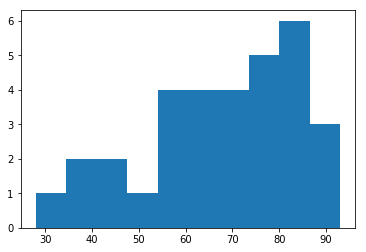

In [1441]:
l = DeadArtist['LifeSpan']
import matplotlib.pyplot as plt
plt.hist(l)

In [1442]:
l.describe()

count    32.000000
mean     67.375000
std      17.284619
min      28.000000
25%      56.000000
50%      67.000000
75%      81.500000
max      93.000000
Name: LifeSpan, dtype: float64

In [1443]:
join_df1 =join_df.drop([24], axis=0) #drop alive artists' work
#Plot relationship between artist's lifespan and age they created one of their masterpiece
import plotly
import plotly.plotly as py
from plotly import tools
from plotly.graph_objs import *
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout, Box, Histogram

init_notebook_mode()

trace_Life = Bar(x=join_df1.Painting,
                  y=join_df1.LifeSpan,
                  name='Life',
                  marker=dict(color='#A2D5F2'))

trace_Work = Bar(x=join_df1.Painting,
                  y=join_df1.Age,
                  name='Work',
                  marker=dict(color='#ffcdd2'))

data = [trace_Life, trace_Work]

layout = Layout(title="Masterpiece & Life Span",
                xaxis=dict(title='Painting Name'),
                yaxis=dict(title='Year',range=[0,100]))

fig = Figure(data=data, layout=layout)

iplot(fig, filename='Masterpiece & Life Span')

### Conclusion: Financially successful artists actually enjoy a pretty long life
 as long as avoid getting sick at young age like Van Gogh (Suicide), Modigliani (Meningitis) or Basquiat (ADIS).
 ### Further research to be done: how active artists are in their late life

### Which gender has better chance? 
#### pip3 install gender

from gender import GenderDetector

gd = GenderDetector()

gd.gender('jaeden collins')

#### pip install gender-guesser
d = gender.Detector()

d.get_gender("Firstname")

In [1444]:
#Get Gender from for all artists using python gender-guesser package
import gender_guesser.detector as gender
d = gender.Detector()
g =[]
for x in pdcount['Artist']:
    g.append(d.get_gender(x.split()[0]))
pdcount['Gender']=g
pdcount

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan,Gender
8,Pablo Picasso,14,1881.0,1973,92.0,male
11,Vincent van Gogh,9,1853.0,1890,37.0,male
16,Andy Warhol,7,1928.0,1987,59.0,male
6,Mark Rothko,6,1903.0,1970,67.0,male
1,Willem de Kooning,4,1904.0,1997,93.0,male
9,Amedeo Modigliani,4,1884.0,1920,36.0,male
12,Francis Bacon (artist),4,1909.0,1992,83.0,male
3,Paul Gauguin,3,1848.0,1903,55.0,male
21,Claude Monet,3,1840.0,1926,86.0,mostly_male
20,Titian,3,1490.0,1576,86.0,unknown


In [1445]:
#Get gender indicator count from Summary for all artists
m=[]
f=[]
a=[]
for x in pdcount['Artist']:
    text = wikipedia.summary(x,sentences=10)
    a.append(x)
    m.append(text.count(" his ")+ text.count(" he "))
    f.append(text.count(" her ")+ text.count(" she "))

GenderIdentification = pd.DataFrame() 
GenderIdentification['Artist']=a
GenderIdentification['MaleIndicator']=m
GenderIdentification['FemaleIndicator']=f
GenderIdentification['Calc'] = GenderIdentification['MaleIndicator']-GenderIdentification['FemaleIndicator']
g=[]
for x in GenderIdentification['Calc']:
    if x > 0:
        g.append("male")
    else:
        g.append("female")
GenderIdentification['Gender']=g
GenderIdentification

,Artist,MaleIndicator,FemaleIndicator,Calc,Gender
0,Pablo Picasso,14,0,14,male
1,Vincent van Gogh,6,0,6,male
2,Andy Warhol,4,0,4,male
3,Mark Rothko,9,0,9,male
4,Willem de Kooning,4,0,4,male
5,Amedeo Modigliani,7,0,7,male
6,Francis Bacon (artist),12,0,12,male
7,Paul Gauguin,10,0,10,male
8,Claude Monet,10,0,10,male
9,Titian,11,0,11,male


In [1447]:
pdcount['Gender']=g
join_df = Clean.merge(pdcount, on="Artist", how='left')
pdcount

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan,Gender
8,Pablo Picasso,14,1881.0,1973,92.0,male
11,Vincent van Gogh,9,1853.0,1890,37.0,male
16,Andy Warhol,7,1928.0,1987,59.0,male
6,Mark Rothko,6,1903.0,1970,67.0,male
1,Willem de Kooning,4,1904.0,1997,93.0,male
9,Amedeo Modigliani,4,1884.0,1920,36.0,male
12,Francis Bacon (artist),4,1909.0,1992,83.0,male
3,Paul Gauguin,3,1848.0,1903,55.0,male
21,Claude Monet,3,1840.0,1926,86.0,male
20,Titian,3,1490.0,1576,86.0,male


In [1448]:
pdcount['Gender'].value_counts()

male    33
Name: Gender, dtype: int64

### Noted that all artists in dataset are male

### Which nationality has better chance?
pip install geograpy3

pip install geotext

Above packages work better for country or city names, not the best at identifying nationality

In [1449]:
C=[]
for x in pdcount['Artist']:
    text = wikipedia.summary(x,sentences=4)
    try:
        Q = text.split(" was ")[1]
        k= Q.split()[1]   
    except:
        Q = text.split(" is ")[1]
        k= Q.split()[1]         
    C.append(k)
C

['Spanish',
 'Dutch',
 'American',
 'American',
 'Dutch',
 'Italian',
 'Irish-born',
 'French',
 'French',
 'Italian',
 'Austrian',
 'French',
 'American',
 'American',
 'American',
 'American',
 'American',
 'Chinese',
 'French',
 'French',
 'Italian',
 'Chinese',
 'French',
 'American',
 'Italian',
 'German',
 'Russian',
 'Flemish',
 'American',
 'Norwegian',
 'French',
 'Dutch',
 'American']

In [1300]:
#Alternative method tried, not as good as the above:
import csv
nationality = pd.read_csv('https://raw.githubusercontent.com/knowitall/chunkedextractor/master/src/main/resources/edu/knowitall/chunkedextractor/demonyms.csv')
nationality.columns = ['Nationality','Country']
natList = nationality['Nationality'].tolist()
#match artist's summary to the list of nationality
n=[]
for x in pdcount['Artist']:
    text = wikipedia.summary(x,sentences=2)
    N = [x for x in natList if x in text]
    n.append(N[0])
n

['Spanish',
 'Dutch',
 'American',
 'American',
 'Dutch',
 'Italian',
 'British',
 'French',
 'French',
 'English',
 'Austrian',
 'French',
 'American',
 'American',
 'American',
 'American',
 'American',
 'Chinese',
 'French',
 'French',
 'Florentine',
 'Chinese',
 'French',
 'American',
 'Italian',
 'German',
 'Russian',
 'Dutch',
 'American',
 'German',
 'French',
 'Dutch',
 'American']

In [1450]:
pdcount['Nationality'] = C
pdcount

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan,Gender,Nationality
8,Pablo Picasso,14,1881.0,1973,92.0,male,Spanish
11,Vincent van Gogh,9,1853.0,1890,37.0,male,Dutch
16,Andy Warhol,7,1928.0,1987,59.0,male,American
6,Mark Rothko,6,1903.0,1970,67.0,male,American
1,Willem de Kooning,4,1904.0,1997,93.0,male,Dutch
9,Amedeo Modigliani,4,1884.0,1920,36.0,male,Italian
12,Francis Bacon (artist),4,1909.0,1992,83.0,male,Irish-born
3,Paul Gauguin,3,1848.0,1903,55.0,male,French
21,Claude Monet,3,1840.0,1926,86.0,male,French
20,Titian,3,1490.0,1576,86.0,male,Italian


In [1451]:
wikipedia.summary("Willem de Kooning",sentences=3)
#Noted that Willem de Kooning later took American Citizen

'Willem de Kooning (; Dutch: [ˈʋɪləm də ˈkoːnɪŋ]; April 24, 1904 – March 19, 1997) was a Dutch abstract expressionist artist. He was born in Rotterdam, in the Netherlands. He moved to the United States in 1926, and became an American citizen in 1962.'

In [1316]:
wikipedia.summary("Francis Bacon (artist)",sentences=1)

'Francis Bacon (28 October 1909 – 28 April 1992) was an Irish-born British figurative painter known for his emotionally charged, raw imagery.'

In [1452]:
pdcount.loc[1, 'Nationality'] = 'American'
pdcount.loc[12, 'Nationality'] = 'British'

In [1468]:
pdcount2 = pdcount.merge(nationality, on='Nationality', how='left')
pdcount2.loc[27, 'Country'] = 'Belgium' #change to modern country name
pdcount2

,Artist,paintingscount,BirthYear,DeathYear,LifeSpan,Gender,Nationality,Country
0,Pablo Picasso,14,1881.0,1973,92.0,male,Spanish,Spain
1,Vincent van Gogh,9,1853.0,1890,37.0,male,Dutch,Netherlands
2,Andy Warhol,7,1928.0,1987,59.0,male,American,United States
3,Mark Rothko,6,1903.0,1970,67.0,male,American,United States
4,Willem de Kooning,4,1904.0,1997,93.0,male,American,United States
5,Amedeo Modigliani,4,1884.0,1920,36.0,male,Italian,Italy
6,Francis Bacon (artist),4,1909.0,1992,83.0,male,British,United Kingdom
7,Paul Gauguin,3,1848.0,1903,55.0,male,French,France
8,Claude Monet,3,1840.0,1926,86.0,male,French,France
9,Titian,3,1490.0,1576,86.0,male,Italian,Italy


In [1469]:
from collections import Counter
countresult2 = Counter(pdcount2['Country'])
CountryRank = pd.DataFrame.from_dict(countresult2, orient='index').reset_index() # Store in dataframe
CountryRank = CountryRank.rename(columns={'index':'Country', 0:'ArtistsCount'})
CountryRank

,Country,ArtistsCount
0,Spain,1
1,Netherlands,2
2,United States,11
3,Italy,4
4,United Kingdom,1
5,France,7
6,Austria,1
7,China,2
8,Germany,1
9,Russia,1


In [1549]:
CountryRank.loc[2, 'Country'] = 'United States of America' #align country name to folium map file
CountryRank

,Country,ArtistsCount
0,Spain,1
1,Netherlands,2
2,United States of America,11
3,Italy,4
4,United Kingdom,1
5,France,7
6,Austria,1
7,China,2
8,Germany,1
9,Russia,1


import urllib, json
url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"
response = urllib.request.urlopen(url)
response

In [1568]:
import os
import urllib, json
import folium

#url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"

state_geo = os.path.join('data', 'world-countries.json')

m = folium.Map(location=[48, -102], zoom_start=3)

m.choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=CountryRank,
    columns=['Country', 'ArtistsCount'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Artists',
    highlight=False
)


folium.LayerControl().add_to(m)

m

### Further Research: for each artist get work information (year created, genere, medium), analyze the most productive life stage, the most popular genere and medium (based on price)
With more work: Which auction house to consign the work?
Best year to make the sale?

In [1566]:
            def color_scale_fun(x):
                idx = len(
                    [
                        u for u in color_domain if
                        get_by_key(x, key_on) in color_data and
                        u <= color_data[get_by_key(x, key_on)]
                    ]
                )
                # CHANGE HERE
                # idx == 0 when there is no match in the data
                # so idx-1 of color_range would return the last value
                # of color_range, we need to change this
                if idx == 0:
                    return nan_fill
                # END OF CHANGE
                return color_range[idx-1]

In [1567]:
state_geo = os.path.join('data', 'world-countries.json')

m = folium.Map(location=[48, -102], zoom_start=3)

m.choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=CountryRank,
    columns=['Country', 'ArtistsCount'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Artists'
)


folium.LayerControl().add_to(m)

m
